In [1]:
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
import matplotlib.colors as mcolors

rcParams['figure.dpi'] = 500
rcParams['savefig.dpi'] = 500
rcParams['font.family'] = 'Serif'
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 16
rcParams['xtick.labelsize'] = 16
rcParams['ytick.labelsize'] = 16
rcParams['legend.fontsize'] = 16
rcParams['figure.titlesize'] = 18
rcParams['figure.constrained_layout.use'] = True

In [3]:
df1 = pd.read_csv('llm-information-entropy.csv', low_memory=False)
df1['datetime'] = pd.to_datetime(df1['datetime'], format='mixed')
print(len(df1))
df2 = pd.read_csv('ml-information-entropy.csv', low_memory=False)
df2['datetime'] = pd.to_datetime(df2['datetime'], format='mixed')
print(len(df2))
df3 = pd.read_csv('non-llm-information-entropy.csv', low_memory=False)
df3['datetime'] = pd.to_datetime(df3['datetime'], format='mixed')
print(len(df3))
df1.head(5)

59239
70945
73110


,id,doi,title,abstract,publication_year,publication_date,created_date,type,cited_by_count,is_retracted,...,GPT_response,author_names,institutions,country_codes,institution_types,affiliation_strings,departments,country_codes_entropy,institutions_entropy,departments_entropy
0,https://openalex.org/W2902614977,https://doi.org/10.18653/v1/w18-6315,Using Monolingual Data in Neural Machine Trans...,Neural Machine Translation (MT) has radically ...,2018,2018-01-01,2018-12-11,preprint,119,False,...,Yes,"['Franck Burlot', 'François Yvon']","['Lingua et Machina (France)', ""Laboratoire d'...","['FR', 'FR']","['company', 'facility']","['Lingua Custodia 1, Place Charles de Gaulle 7...",[],-0.0,1.0,NaN
1,https://openalex.org/W2904631866,https://doi.org/10.48550/arxiv.1812.03593,SDNet: Contextualized Attention-based Deep Net...,Conversational question answering (CQA) is a n...,2018,2018-01-01,2018-12-22,preprint,122,False,...,Yes,"['Chenguang Zhu', 'Michael Zeng', 'Xuedong Hua...",[],[],"[None, None, None]",[],[],NaN,NaN,NaN
2,https://openalex.org/W2913129712,https://doi.org/10.48550/arxiv.1902.04094,"BERT has a Mouth, and It Must Speak: BERT as a...","We show that BERT (Devlin et al., 2018) is a M...",2019,2019-01-01,2019-02-21,preprint,131,False,...,Yes,"['Alex Wang', 'Kyunghyun Cho']","['New York University', 'New York University']","['US', 'US']","['education', 'education']","[' New York University<sup>**</sup>', ' New Yo...",[],-0.0,-0.0,NaN
3,https://openalex.org/W2914029346,https://doi.org/10.48550/arxiv.1902.04260,Table2answer: Read the database and answer wit...,Semantic parsing is the task of mapping natura...,2019,2019-01-01,2019-02-21,preprint,4,False,...,Yes,"['Tong Guo', 'Huilin Gao']",[],[],"[None, None]",[],[],NaN,NaN,NaN
4,https://openalex.org/W2914845972,https://doi.org/10.48550/arxiv.1902.00821,Review Conversational Reading Comprehension,Inspired by conversational reading comprehensi...,2019,2019-01-01,2019-02-21,preprint,17,False,...,Yes,"['Hu Xu', 'Bing Liu', 'Lei Shu', 'Philip S. Yu']",[],[],"[None, None, None, None]",[],[],NaN,NaN,NaN


In [4]:
field_dict = {'Computer Science':'Computer Science',
              'Neuroscience':'Neuroscience',
              'Decision Sciences':'Decision Science',
              'Psychology':'Psychology',
              'Medicine':'Medicine',
              'Biochemistry, Genetics and Molecular Biology':'Bio, Gen & Mol',
              'Earth and Planetary Sciences': 'Earth & Plan Science',
              'Social Sciences':'Social Science',
              'Physics and Astronomy':'Physics & Astronomy',
              'Health Professions':'Health Professions',
              'Environmental Science':'Envir Science',
              'Arts and Humanities':'Arts & Humanities',
              'Energy':'Energy',
              'Engineering':'Engineering',
              'Business, Management and Accounting':'Bus, Mgmt & Acct',
              'Economics, Econometrics and Finance':'Econ, Econom & Fin',
              'Agricultural and Biological Sciences':'Agri & Bio Science',
              'Materials Science':'Materials Science',
              'Chemistry':'Chemistry',
              'Nursing':'Nursing',
              'Veterinary':'Veterinary',
              'Mathematics':'Mathematics',
              'Pharmacology, Toxicology and Pharmaceutics':'Pharmacology Science',
              'Dentistry':'Dentistry',
              'Immunology and Microbiology':'Immuno & Microbio',
              'Chemical Engineering':'Chemical Engineering'
              }

In [5]:
def clean_fields(field_list):
    cleaned_fields = [f.strip() for f in field_list if f.strip()]
    mapped_fields = [field_dict.get(f, f) for f in cleaned_fields]
    fields = list(set(mapped_fields))
    return fields

df1['fields'] = df1['fields'].fillna('').astype(str).str.split(r';')
df1['fields'] = df1['fields'].apply(clean_fields)

exploded_df = df1.explode('fields')
field_counts = exploded_df['fields'].value_counts().reset_index()
field_counts.columns = ['fields', 'count']
field_counts.set_index('fields', inplace=True)
field_counts

,count
fields,
Computer Science,45664
Medicine,11379
Social Science,8695
Engineering,3719
Decision Science,3672
Psychology,3038
"Bio, Gen & Mol",2667
"Bus, Mgmt & Acct",2248
Health Professions,1821


In [6]:
df2['fields'] = df2['fields'].fillna('').astype(str).str.split(r';')
df2['fields'] = df2['fields'].apply(clean_fields)

df3['fields'] = df3['fields'].fillna('').astype(str).str.split(r';')
df3['fields'] = df3['fields'].apply(clean_fields)

In [7]:
top_fields = field_counts.index.tolist()[:12]
top_fields

['Computer Science',
 'Medicine',
 'Social Science',
 'Engineering',
 'Decision Science',
 'Psychology',
 'Bio, Gen & Mol',
 'Bus, Mgmt & Acct',
 'Health Professions',
 'Arts & Humanities',
 'Econ, Econom & Fin',
 'Neuroscience']

### Analyze Overall Entropy 

In [8]:
from scipy import stats

class EntropyAnalyzer:
    def __init__(self, df: pd.DataFrame, sample_freq: str = "Q", 
                 start_date: str = None, end_date: str = None,
                 institution_color: str = 'b',
                 department_color: str = 'g',
                 count_color: str = 'r'):
        self.df = df.copy()
        self.sample_freq = sample_freq
        self.start_date = pd.to_datetime(start_date) if start_date else self.df['datetime'].min()
        self.end_date = pd.to_datetime(end_date) if end_date else self.df['datetime'].max()
        self.institution_color = institution_color
        self.department_color = department_color
        self.count_color = count_color
        self._prepare_data()
        
    def _prepare_data(self):
        self.df['datetime'] = pd.to_datetime(self.df['datetime'])
        self.df = self.df[(self.df['datetime'] >= self.start_date) & 
                         (self.df['datetime'] <= self.end_date)]
        self.df.set_index('datetime', inplace=True)
        self.df.sort_index(inplace=True)
        
    def _add_regression_line(self, ax: plt.Axes, x: np.ndarray, y: np.ndarray, color: str):
        x_numeric = np.arange(len(x))  # Use array indices instead of datetime
        slope, intercept, r_value, p_value, std_err = stats.linregress(x_numeric, y)
        line = slope * x_numeric + intercept
        #ax.plot(x, line, '--', color=color, alpha=0.5)
        ax.text(0.05, 0.95, f'coeff = {slope:.3f}\nr = {r_value:.2f}', 
                transform=ax.transAxes,
                color=color, 
                fontsize=14,
                ha='left',
                va='top')
    
    def create_visualization(self, ax1, ax2, position=None):
        avg1 = self.df['institutions_entropy'].resample(self.sample_freq).mean()
        avg2 = self.df['departments_entropy'].resample(self.sample_freq).mean()
        counts = self.df['id'].resample(self.sample_freq).count()
        
        line1 = ax1.plot(avg1.index, avg1, marker='o', 
                color=self.institution_color, markerfacecolor='none',
                markeredgewidth=3, markersize=6, alpha = 0.7,
                markeredgecolor=self.institution_color)[0]
        
        self._add_regression_line(ax1, avg1.index.values, avg1.values, self.institution_color)
   
        if position == 'left':
            ax1.set_ylabel('Entropy', color=self.institution_color, fontsize=16)
            ax1.tick_params(axis='y', colors=self.institution_color, labelsize=14)
        else:
            ax1.set_ylabel('')
            ax1.tick_params(axis='y', colors=self.institution_color, labelsize=14, labelleft=False)
        
        ax1_2 = ax1.twinx()
        count_line1 = ax1_2.plot(counts.index, counts, linestyle='--', 
                marker='o', color=self.count_color, markerfacecolor='none', 
                markeredgewidth=2, markersize=6, alpha = 0.7,
                markeredgecolor=self.count_color)[0]
        
        if position == 'right':
            ax1_2.set_ylabel('Count', color=self.count_color, fontsize=16)
            ax1_2.tick_params(axis='y', colors=self.count_color, labelsize=14)
        else:
            ax1_2.set_ylabel('')
            ax1_2.tick_params(axis='y', colors=self.count_color, labelsize=14, labelright=False)
        
        line2 = ax2.plot(avg2.index, avg2, marker='o', 
                color=self.department_color, markerfacecolor='none', 
                markeredgewidth=3, markersize=6, alpha = 0.7,
                markeredgecolor=self.department_color)[0]
        
        self._add_regression_line(ax2, avg2.index.values, avg2.values, self.department_color)

        if position == 'left':
            ax2.set_ylabel('Entropy', color=self.department_color, fontsize=16)
            ax2.tick_params(axis='y', colors=self.department_color, labelsize=14)
        else:
            ax2.set_ylabel('')
            ax2.tick_params(axis='y', colors=self.department_color, labelsize=14, labelleft=False)
        
        ax2_2 = ax2.twinx()
        count_line2 = ax2_2.plot(counts.index, counts, linestyle='--', 
                marker='o', color=self.count_color, markerfacecolor='none', 
                markeredgewidth=2, markersize=6, alpha = 0.7,
                markeredgecolor=self.count_color)[0]
        
        if position == 'right':
            ax2_2.set_ylabel('Count', color=self.count_color, fontsize=16)
            ax2_2.tick_params(axis='y', colors=self.count_color, labelsize=14)
        else:
            ax2_2.set_ylabel('')
            ax2_2.tick_params(axis='y', colors=self.count_color, labelsize=14, labelright=False)
        
        reference_date = pd.to_datetime('2022-12-01')
        ax1.axvline(reference_date, color='gray', linestyle='--', linewidth=2, alpha=0.5)
        ax2.axvline(reference_date, color='gray', linestyle='--', linewidth=2, alpha=0.5)
        
        # Set year ticks at the start of each year
        years = pd.date_range(start=pd.to_datetime('2019-01-01'), 
                                end=pd.to_datetime('2024-01-01'), 
                                freq='YS')
        years = years + pd.DateOffset(months=3)
        ax1.set_xticks(years)
        ax1.set_xticklabels([])
        ax2.set_xticks(years)
        ax2.set_xticklabels([str(d.year)[-2:] for d in years], fontsize=14)
        ax2.set_xlabel('Year', fontsize=16)
        
        ax1.set_ylim(0, 1.2)
        ax2.set_ylim(0, 1.2)
        ax1_2.set_ylim(0, 12000)
        ax2_2.set_ylim(0, 12000)
        
        # Adjust spacing
        ax1.margins(x=0.02)
        ax2.margins(x=0.02)
        
        return line1, line2, count_line1

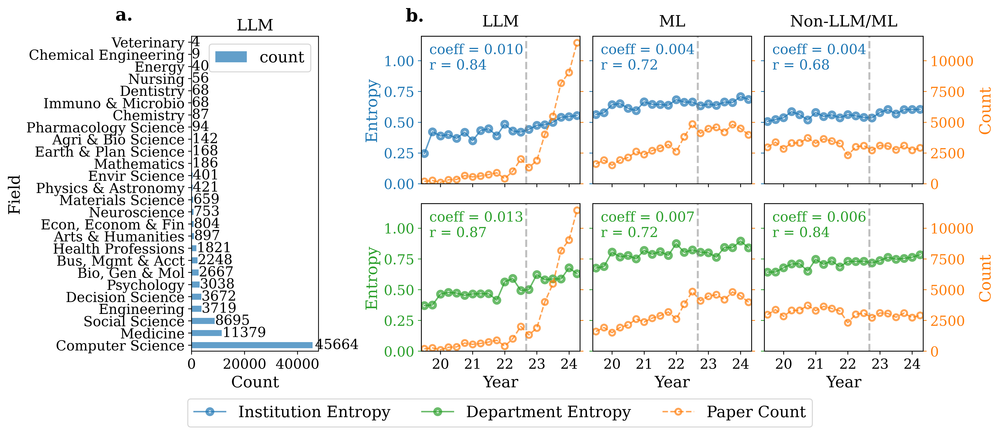

In [169]:
sample_freq = "Q"
start_date = '2019-07-01'
end_date = '2024-06-30'
colors = ['#1f77b4', '#2ca02c', '#ff7f0e']

# Main plotting code
fig = plt.figure(figsize=(14, 5.5))
gs = fig.add_gridspec(2, 4, width_ratios=[0.8, 1, 1, 1], wspace=0.02)

# Bar plot
ax_bar = fig.add_subplot(gs[:, 0])
bars = field_counts.plot(kind='barh', ax=ax_bar, color=colors[0], alpha = 0.7)
for bar in bars.patches:
    ax_bar.text(bar.get_width() + bar.get_width() * 0.02, 
                bar.get_y() + bar.get_height() / 2,
                int(bar.get_width()), 
                ha='left', va='center', 
                color='black', fontsize=14)
ax_bar.set_xlabel('Count', fontsize=16)
ax_bar.set_ylabel('Field', fontsize=16)
ax_bar.tick_params(axis='both', labelsize=14)
ax_bar.set_title('LLM')
ax_bar.text(-0.6, 1.05, 'a.', transform=ax_bar.transAxes, 
            fontsize=18, fontweight='bold', 
            bbox=dict(facecolor='white', edgecolor='none', pad=3))



datasets = [df1, df2, df3]
positions = ['left', 'middle', 'right']
titles = ['LLM', 'ML', 'Non-LLM/ML']
all_axes = []

for i, (df, pos, title) in enumerate(zip(datasets, positions, titles)):
   ax1 = fig.add_subplot(gs[0, i+1])
   ax2 = fig.add_subplot(gs[1, i+1])
   
   if i > 0:
       ax1.sharey(all_axes[0][0])
       ax2.sharey(all_axes[0][1])
   
   all_axes.append((ax1, ax2))
   
   analyzer = EntropyAnalyzer(df, 
                             sample_freq=sample_freq,
                             start_date=start_date,
                             end_date=end_date,
                             institution_color=colors[0],
                             department_color=colors[1],
                             count_color=colors[2])
   
   if i == 0:
       line1, line2, count_line = analyzer.create_visualization(ax1, ax2, position=pos)
       ax1.text(-0.1, 1.1, 'b.', transform=ax1.transAxes,
                fontsize=18, fontweight='bold',
                bbox=dict(facecolor='white', edgecolor='none', pad=3))
   else:
       analyzer.create_visualization(ax1, ax2, position=pos)
       
   # Add title for each column
   ax1.set_title(title, fontsize=16, pad=10)

fig.legend([line1, line2, count_line],
          ['Institution Entropy', 'Department Entropy', 'Paper Count'],
          loc='center', bbox_to_anchor=(0.5, -0.05), ncol=3, fontsize=16)

plt.savefig('Figure 1.pdf', bbox_inches='tight', dpi=300)
plt.show()

### Compare Entropy across Fields

In [170]:
from scipy import stats
from statsmodels.nonparametric.smoothers_lowess import lowess

def filter_dataframe(df, column, field, start_date, end_date):
    """Filter DataFrame based on date range and field."""
    if column == 'fields':
        df = df.explode(column).reset_index(drop=True)
        filtered_df = df[
            (df['datetime'] <= pd.to_datetime(end_date)) & 
            (df['datetime'] >= pd.to_datetime(start_date)) &
            (df[column] == field)
        ]
    elif column == 'primary_field':
        filtered_df = df[
            (df['datetime'] <= pd.to_datetime(end_date)) & 
            (df['datetime'] >= pd.to_datetime(start_date)) &
            (df['primary_field'] == field)
        ]
    return filtered_df

def calculate_statistics(filtered_df, entropy_column, sample, method='errorbar'):
    """Calculate statistics using either error bars or LOESS."""
    df_stats = filtered_df.copy()
    if 'datetime' in df_stats.columns:
        df_stats.set_index('datetime', inplace=True)
    
    if method == 'errorbar':
        resampled = df_stats[entropy_column].resample(sample)
        avg = resampled.mean()
        sem = resampled.sem()
        counts = resampled.count()
        ci = sem * stats.t.ppf((1 + 0.95) / 2., counts - 1)
        return avg, ci
    elif method == 'loess':
        # First resample the data to reduce noise and computation time
        resampled = df_stats[entropy_column].resample('D').mean()
        
        # Remove NaN values
        resampled = resampled.dropna()
        
        if len(resampled) < 2:
            return pd.Series(), None
            
        # Convert datetime index to numeric for LOESS
        x = (resampled.index - resampled.index.min()).total_seconds()
        y = resampled.values
        
        # Perform LOESS smoothing
        loess_smoothed = lowess(y, x, frac=0.3, it=1, delta=0.1 * (x.max() - x.min()))
        
        # Create Series with datetime index
        smoothed_series = pd.Series(
            loess_smoothed[:, 1],
            index=resampled.index
        )
        
        # Resample to match the desired frequency
        avg = smoothed_series.resample(sample).mean()
        return avg, None

def plot_temporal_combined(datasets, column, entropy_column, field, start_date, end_date,
                         ax, sample, is_first=False, method='errorbar', plot_index=None):
    """Plot temporal data for multiple datasets in one figure."""
    common_dates = pd.date_range(start=start_date, end=end_date, freq=sample)
    
    lines = []  # Store lines for legend
    for dataset in datasets:
        df, color, label = dataset
        filtered_df = filter_dataframe(df, column, field, start_date, end_date)
        
        if not filtered_df.empty:
            avg, ci = calculate_statistics(filtered_df, entropy_column, sample, method)
            
            if len(avg) == 0:  # Skip if no data
                continue
                
            # Align to common dates
            avg = avg.reindex(common_dates, method='nearest')
            if ci is not None:
                ci = ci.reindex(common_dates, method='nearest')
            
            # Plot based on method
            if method == 'errorbar':
                line = ax.errorbar(avg.index-pd.DateOffset(months=3), avg, yerr=ci,
                                 marker='o', linestyle='-', color=color, ecolor=color,
                                 alpha=0.7, capsize=5, markerfacecolor='none',
                                 markeredgewidth=2, markeredgecolor=color, label=label)
                lines.append(line)
            elif method == 'loess':
                # Plot smoothed line
                line, = ax.plot(avg.index-pd.DateOffset(months=3), avg,
                              color=color, label=label, linewidth=2)
                # Add scatter points for raw data (resampled to monthly to reduce clutter)
                monthly_data = filtered_df.set_index('datetime')[entropy_column].resample('M').mean()
                ax.scatter(monthly_data.index-pd.DateOffset(months=3),
                          monthly_data.values,
                          color=color, alpha=0.2, s=20)
                lines.append(line)
    
    # Customize plot
    ax.set_title(field, pad=10)
    ax.set_ylim(-0.05, 1.85)
    ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%y'))
    
    # Add vertical line for ChatGPT release
    ax.axvline(pd.to_datetime('2022-12-01')-pd.DateOffset(months=1),
               color='gray', linestyle='--', linewidth=1, alpha=0.5)
    
    # Show all spines
    y_label = entropy_column.title()
    y_label = y_label.split('s_')
    y_label = ' '.join(y_label) 

    for spine in ax.spines.values():
        spine.set_visible(True)
    
    if is_first:
        ax.set_ylabel(y_label)
    
    # Add labels only for plots in the first row (indices 0-3)
    if plot_index is not None and plot_index < 1:
        if 'institution' in y_label.lower():
            ax.text(-0.25, 1.08, 'a.', transform=ax.transAxes, 
                fontsize=20, fontweight='bold', 
                bbox=dict(facecolor='white', edgecolor='none', pad=3))
        elif 'department' in y_label.lower():
            ax.text(-0.25, 1.08, 'b.', transform=ax.transAxes, 
                fontsize=20, fontweight='bold', 
                bbox=dict(facecolor='white', edgecolor='none', pad=3))
    return lines


def create_temporal_plots(datasets, top_fields, column, entropy_column,
                         start_date, end_date, sample, method):
    """Create subplot grid with combined temporal plots."""
    fig, axs = plt.subplots(3, 4, figsize=(13, 9))
    axs = axs.flatten()
    
    first_lines = None
    
    for i, field in enumerate(top_fields):
        is_first = (i % 4 == 0)
        lines = plot_temporal_combined(datasets, column, entropy_column, field, 
                                       start_date, end_date, axs[i], sample, 
                                       is_first, method, plot_index=i)
        if i == 0:
            first_lines = lines
    
    # Create common legend at the bottom
    if first_lines:
        labels = [dataset[2] for dataset in datasets]
        fig.legend(first_lines, labels, loc='center',
                  bbox_to_anchor=(0.5, 0.02), ncol=3)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.1)

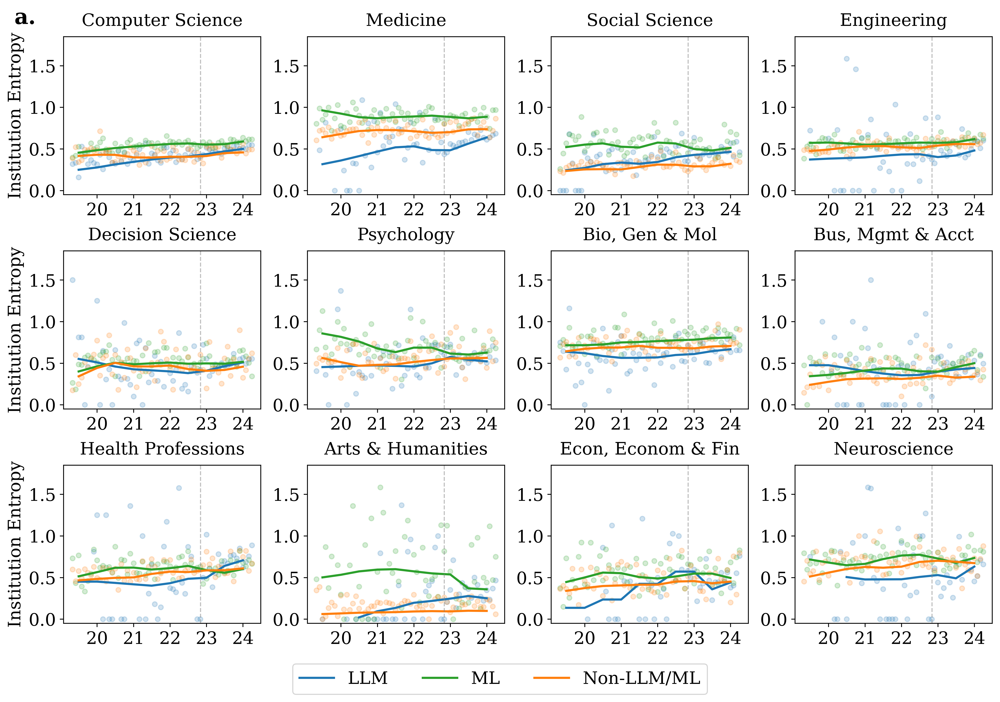

In [171]:
datasets = [
    (df1, '#1f77b4', 'LLM'),
    (df2, '#2ca02c', 'ML'),
    (df3, '#ff7f0e', 'Non-LLM/ML')
]

# Create and show the plot
fig = create_temporal_plots(
    datasets=datasets,
    top_fields=top_fields,
    column='fields',
    entropy_column='institutions_entropy',
    start_date='2019-07-01',
    end_date='2024-06-30',
    sample='2Q',
    method='loess'
)
plt.savefig('Figure 2a.pdf', bbox_inches='tight', dpi=300)
plt.show()

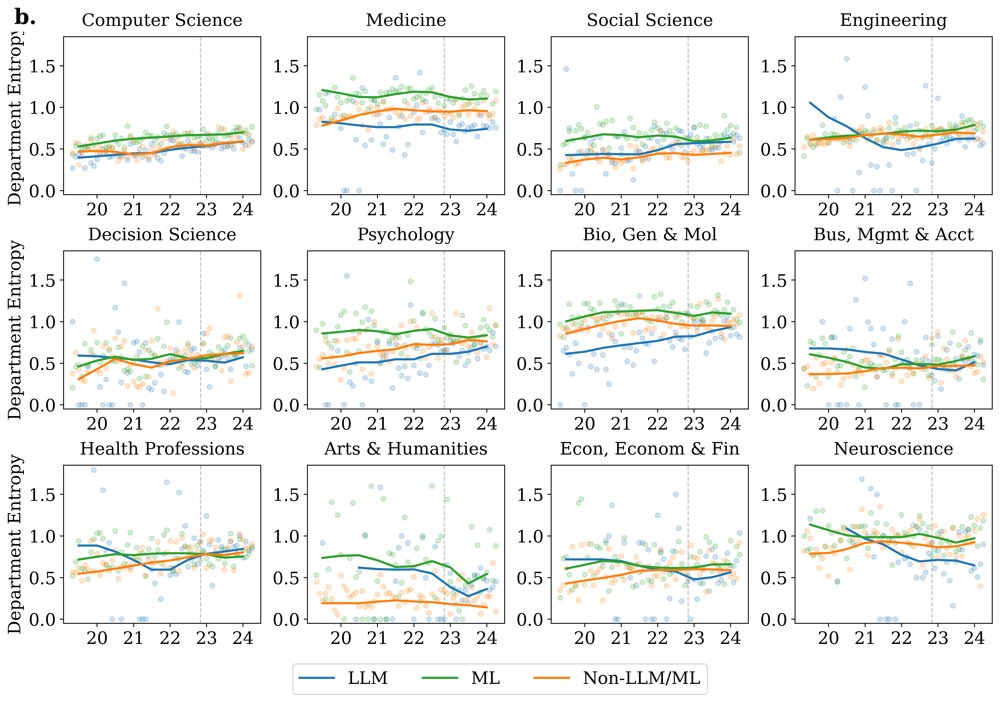

In [12]:
# Create and show the plot
fig = create_temporal_plots(
    datasets=datasets,
    top_fields=top_fields,
    column='fields',
    entropy_column='departments_entropy',
    start_date='2019-07-01',
    end_date='2024-06-30',
    sample='2Q',
    method='loess'
)

plt.savefig('Figure 2b.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [13]:
print(len(df1.dropna(subset='institutions_entropy')))
print(len(df2.dropna(subset='institutions_entropy')))
print(len(df3.dropna(subset='institutions_entropy')))
print(len(df1.dropna(subset='departments_entropy')))
print(len(df2.dropna(subset='departments_entropy')))
print(len(df3.dropna(subset='departments_entropy')))

30075
56658
47002
22453
48795
40579


### Compare Entropy before and after ChatGPT's Release

In [33]:
def wilcoxon_test_temporal(df, column, entropy_column, field, date):
    df = df.dropna(subset=entropy_column)
    df = df.explode(column).reset_index(drop=True)
    df1 = df[df['datetime'] <= date]
    df2 = df[df['datetime'] > date]
    entropy1 = df1[df1[column] == field][entropy_column]
    entropy2 = df2[df2[column] == field][entropy_column]
    _, p_value = stats.ranksums(entropy1, entropy2)
    return p_value


def create_comparison(df, column, entropy_column, fields, date):
    # Initialize the plot
    fig, ax = plt.subplots(figsize=(10, 6))
    box_data = {'Field': [], 'Entropy': [], 'Group': []}
    p_values = []

    if column == 'fields':
        df = df.explode(column).reset_index(drop=True)

    for i, field in enumerate(fields):
        # Extract entropy values before and after created_date for each topic
        entropy_before = df[(df[column] == field) & (df['datetime'] <= date)][entropy_column]
        entropy_after = df[(df[column] == field) & (df['datetime'] > date)][entropy_column]

        # Calculate Wilcoxon p-value
        p_value = wilcoxon_test_temporal(df, column, entropy_column, field, date)
        p_values.append(p_value)

        # Append data for boxplot
        box_data['Field'].append(field)
        box_data['Entropy'].append(entropy_before)
        box_data['Group'].append('Before')
        box_data['Field'].append(field)
        box_data['Entropy'].append(entropy_after)
        box_data['Group'].append('After')

    box_data_df = pd.DataFrame(box_data)

    # Flatten the lists in the 'Entropy' column to use in seaborn boxplot
    box_data_flat = {'Field': [], 'Entropy': [], 'Group': []}
    for i, row in box_data_df.iterrows():
        for entropy_value in row['Entropy']:
            box_data_flat['Field'].append(row['Field'])
            box_data_flat['Entropy'].append(entropy_value)
            box_data_flat['Group'].append(row['Group'])

    box_data_flat_df = pd.DataFrame(box_data_flat)

    # Create boxplot
    sns.boxplot(data=box_data_flat_df, x='Field', y='Entropy', hue='Group', fill=False, gap=.1,
            palette={'Before': 'blue', 'After': 'red'})

    # Add p-values above the boxes
    for i, field in enumerate(fields):
        ax.text(i, 0.8, f'{p_values[i]:.3f}', ha='center', va='center', 
                transform=ax.get_xticklabels()[i].get_transform(), fontsize=12)

    # Finalize plot
    # ax.set_title(f'Distribution of Shannon Entropy Before and After {created_date}')
    #ax.set_xlabel('Field')
    ax.set_ylabel('Shannon Entropy')
    ax.set_xticklabels(fields, rotation=90, ha='center')
    ax.legend(loc='upper right', ncol=2)
    plt.tight_layout()
    plt.show()

date = '2022-12-01'
column = 'fields'
entropy_column = 'institutions_entropy'
create_comparison(df1, column, entropy_column, top_fields, date)

date = '2022-12-01'
column = 'fields'
entropy_column = 'departments_entropy'
create_comparison(df1, column, entropy_column, top_fields, date)


In [205]:
def wilcoxon_test_temporal(df, column, entropy_column, field, date):
    df = df.dropna(subset=entropy_column)
    df = df.explode(column).reset_index(drop=True)
    df1 = df[df['datetime'] <= date]
    df2 = df[df['datetime'] > date]
    entropy1 = df1[df1[column] == field][entropy_column]
    entropy2 = df2[df2[column] == field][entropy_column]
    _, p_value = stats.ranksums(entropy1, entropy2)
    return p_value

def create_panel_temporal(df, fields, date):
    # Initialize the plot with two subplots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    
    # Lists to store data for both entropy types
    entropy_types = ['institutions_entropy', 'departments_entropy']
    titles = ['Institution', 'Department']
    axes = [ax1, ax2]
    
    for idx, (entropy_column, ax, title) in enumerate(zip(entropy_types, axes, titles)):
        box_data = {'Field': [], 'Entropy': [], 'Group': []}
        p_values = []
        
        df = df.explode('fields').reset_index(drop=True)
        
        for field in fields:
            # Extract entropy values before and after created_date for each topic
            entropy_before = df[(df['fields'] == field) & (df['datetime'] <= date)][entropy_column]
            entropy_after = df[(df['fields'] == field) & (df['datetime'] > date)][entropy_column]
            
            # Calculate Wilcoxon p-value
            p_value = wilcoxon_test_temporal(df, 'fields', entropy_column, field, date)
            p_values.append(p_value)
            
            # Append data for boxplot
            box_data['Field'].extend([field] * len(entropy_before))
            box_data['Entropy'].extend(entropy_before)
            box_data['Group'].extend(['Before'] * len(entropy_before))
            
            box_data['Field'].extend([field] * len(entropy_after))
            box_data['Entropy'].extend(entropy_after)
            box_data['Group'].extend(['After'] * len(entropy_after))
        
        box_data_df = pd.DataFrame(box_data)
        
        # Create boxplot with flipped axes
        sns.boxplot(data=box_data_df, y='Field', x='Entropy', hue='Group', 
                   fill=False, gap=.1, palette={'Before': '#1f77b4', 'After': '#ff7f0e'}, ax=ax)
        
        # Add p-values next to the boxes
        for i, field in enumerate(fields):
            ax.text(ax.get_xlim()[1] * 1.02, i, f'p={p_values[i]:.3f}', 
                   va='center', fontsize=16)
        
        # Customize subplot
        ax.set_title(f'{title}')
        ax.set_xlabel(f'{title} Entropy')
        ax.set_ylabel('Field')
        ax.legend(loc='lower right', ncol=1)

        # Only set ylabel for the first subplot
        if idx == 0:
            ax.set_ylabel('Field')
        else:
            ax.set_ylabel('')  # Remove y-label for second subplot
            ax.set_yticklabels([])  # Remove y-tick labels for second subplot

        # Add subplot labels 'a.' and 'b.'
        ymax = len(fields)
        if idx == 0:
            ax.text(-0.6, ymax-13, 'a.', fontsize=20, fontweight='bold')
        else:
            ax.text(-0.6, ymax-13, 'b.', fontsize=20, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(r'temporal_comparison.pdf', bbox_inches='tight')
    plt.show()

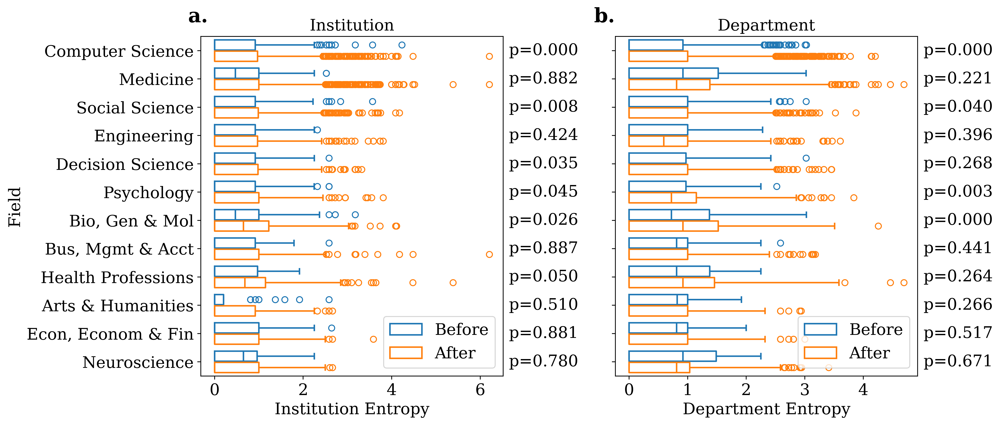

In [206]:
date = '2022-12-01'
create_panel_temporal(df1, top_fields, date)

In [238]:
from matplotlib.ticker import FuncFormatter

def wilcoxon_test_field(field1, field2, df, column, entropy_column):
    entropy1 = df[df[column] == field1][entropy_column]
    entropy2 = df[df[column] == field2][entropy_column]
    _, p_value = stats.ranksums(entropy1, entropy2)
    return p_value

def create_panel_testing(df, column, fields, created_date):
    # Split data into before and after created_date
    df1 = df[df['datetime'] <= pd.to_datetime(created_date)]
    df2 = df[df['datetime'] > pd.to_datetime(created_date)]
    
    # Process dataframes for both entropy types
    all_matrices = []
    for entropy_column in ['institutions_entropy', 'departments_entropy']:
        dfs = []
        for split_df in [df1, df2]:
            if column == 'fields':
                temp_df = split_df.dropna(subset=[entropy_column])
                temp_df = temp_df.explode(column).reset_index(drop=True)
            temp_df = temp_df[temp_df[column].isin(fields)].copy()
            temp_df['field_order'] = temp_df[column].map({field: i for i, field in enumerate(fields)})
            temp_df = temp_df.sort_values('field_order')
            dfs.append(temp_df)
        
        # Calculate Wilcoxon matrices
        period_matrices = []
        for split_df in dfs:
            wilcoxon_matrix = [[wilcoxon_test_field(f1, f2, split_df, column, entropy_column) 
                               for f2 in fields] for f1 in fields]
            period_matrices.append(np.array(wilcoxon_matrix))
        all_matrices.extend(period_matrices)

    # Create the color scheme
    before_color = '#1f77b4'  # Blue
    after_color = '#ff7f0e'   # Orange
    before_alphas = np.linspace(0, 0.8, 5)
    after_alphas = np.linspace(0, 0.8, 5)
    before_colors = [mcolors.to_rgba(before_color, alpha=alpha) for alpha in before_alphas]
    before_colors.reverse()
    after_colors = [mcolors.to_rgba(after_color, alpha=alpha) for alpha in after_alphas]
    after_colors.reverse()
    bounds = [0.0000, 0.0001, 0.0010, 0.0100, 0.0500, 1.0000]
    before_cmap = mcolors.LinearSegmentedColormap.from_list("before", before_colors, N=256)
    after_cmap = mcolors.LinearSegmentedColormap.from_list("after", after_colors, N=256)
    norm = mcolors.BoundaryNorm(bounds, 256)

    # Create figure with 2x2 grid plus colorbar
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()
    titles = ['Institution_Before', 'Institution_After', 'Department_Before', 'Department_After']
    cmaps = [before_cmap, after_cmap, before_cmap, after_cmap]  # Alternate between blue and orange

    # Plot heatmaps
    for idx, (ax, matrix, title, cmap) in enumerate(zip(axes, all_matrices, titles, cmaps)):
        sns.heatmap(matrix,
                    annot=False,
                    cmap=cmap,
                    norm=norm,
                    xticklabels=fields if idx >= 2 else [],  # Only bottom plots get x labels
                    yticklabels=fields if idx % 2 == 0 else [],  # Only left plots get y labels
                    ax=ax,
                    cbar=True,  # Add color bar for each heatmap
                    cbar_kws={"shrink": 0.7},
                    linewidths=0.8,
                    linecolor='black')
        ax.set_title(title)
        
        # Rotate x-axis labels for better readability (only for bottom plots)
        if idx >= 2:
            ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')
        if idx % 2 == 0:
            ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
    
        # Format colorbar with four significant digits
        cbar = ax.collections[0].colorbar
        cbar.set_ticks([0, 0.0001, 0.001, 0.01, 0.05])
        cbar.set_ticklabels(['0', '0.0001', '0.001', '0.01', '0.05'])  # Four-digit format

    # Add annotations (a., b., etc.)
    axes[0].text(-0.15, 1.1, 'a.', transform=axes[0].transAxes, fontsize=20, fontweight='bold', va='top', ha='left')
    axes[2].text(-0.15, 1.1, 'b.', transform=axes[2].transAxes, fontsize=20, fontweight='bold', va='top', ha='left')

    # Adjust spacing for color bars
    plt.subplots_adjust(left=0.08, right=0.92, top=0.92, bottom=0.1, wspace=0.4, hspace=0.4)

    # Save the figure
    plt.savefig('testing_comparison.pdf', bbox_inches='tight')
    plt.show()


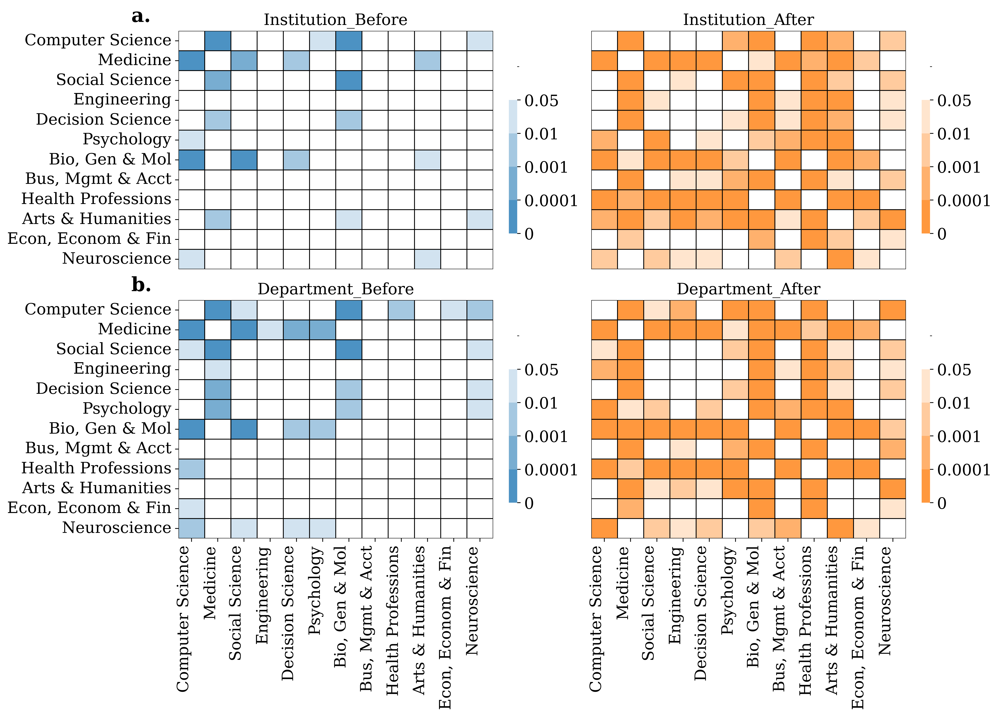

In [239]:
created_date = '2022-12-01'
column = 'fields'
create_panel_testing(df1, column, top_fields, created_date)